In [157]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray
from skimage.measure import label, regionprops
import skimage

In [158]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.02, HeightSpace = 0.1):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [159]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())      

In [160]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth 
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM
    
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST) 
    return resizedIM

### 1/ Với mỗi các phương pháp Morphology sau kiếm 1 ảnh từ internet làm ví dụ thể hiện rõ kết quả nhất :




#### **-	Dilation**


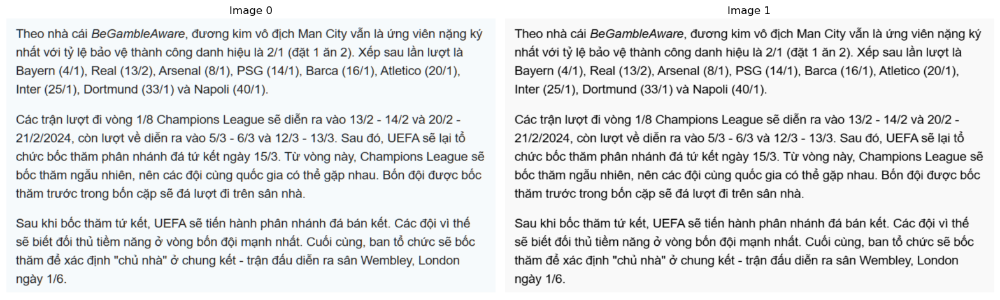

In [161]:
# Read image
img_color = cv2.imread("text.jpg")

img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)

ShowImage([img_color, img_gray], 1, 2) 

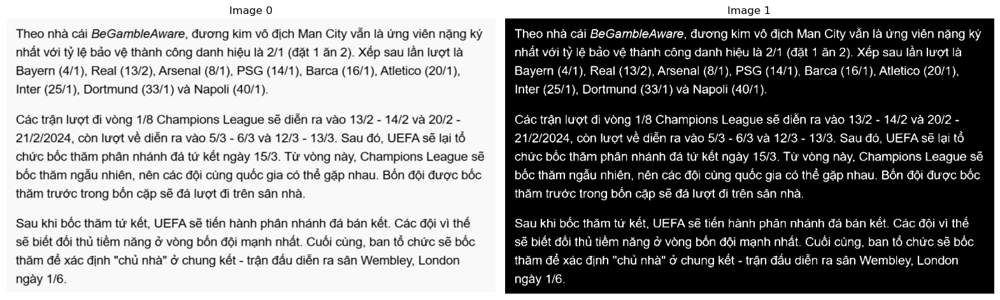

In [162]:
img_mask = (img_gray < 150).astype(np.uint8) * 255
ShowImage([img_gray, img_mask], 1, 2)

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


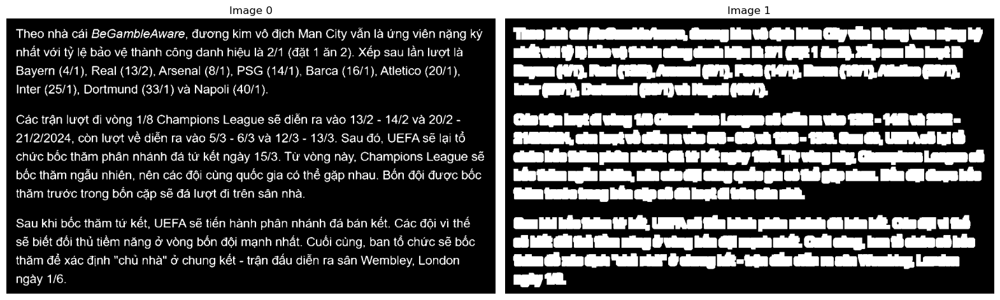

In [163]:
kernel = np.ones((5,5), np.uint8)
print(kernel)

img_dilated = cv2.dilate(img_mask, kernel, iterations = 2)
ShowImage([img_mask, img_dilated], 1, 2)

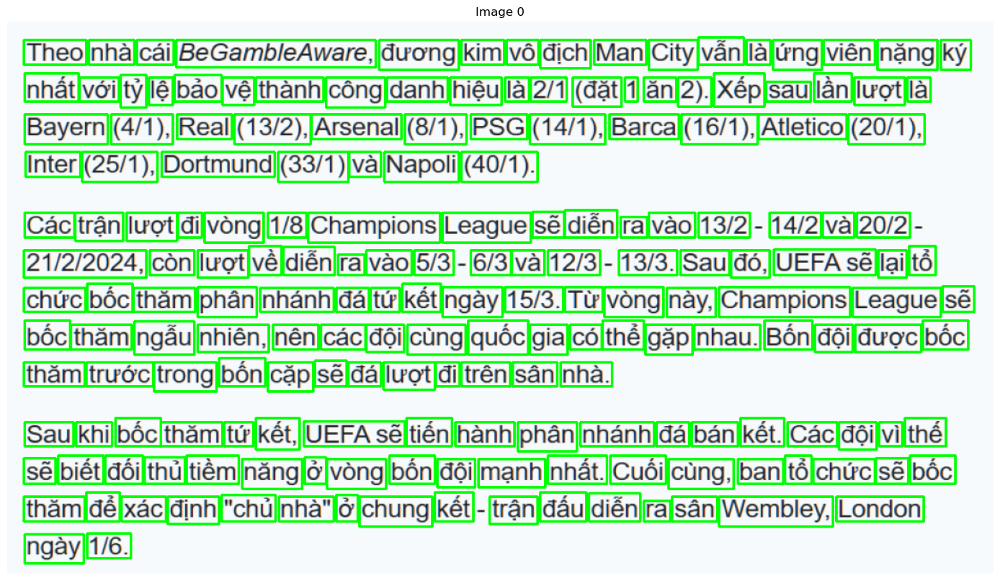

,x,y,w,h
0,20,599,69,34
1,93,598,51,29
3,743,560,31,24
4,968,555,102,29
5,831,555,133,35


In [164]:
def detect_all_object(img, img_mask, color = (0, 255, 0), index: list = None):
    result = img.copy()

    contours, hierarchy = cv2.findContours(img_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    data_df = pd.DataFrame(columns=['x', 'y', 'w', 'h'])

    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h > 300:
            cv2.rectangle(result, (x, y), (x + w, y + h), color, 2)
            data_df.loc[i, :] = (x, y, w, h)
            
    data_df = data_df.astype(int)
    return data_df, result

data_df, result = detect_all_object(img_color, img_dilated)
ShowImage([result], 1, 1)
display(data_df.head())

#### **-	Erosion**


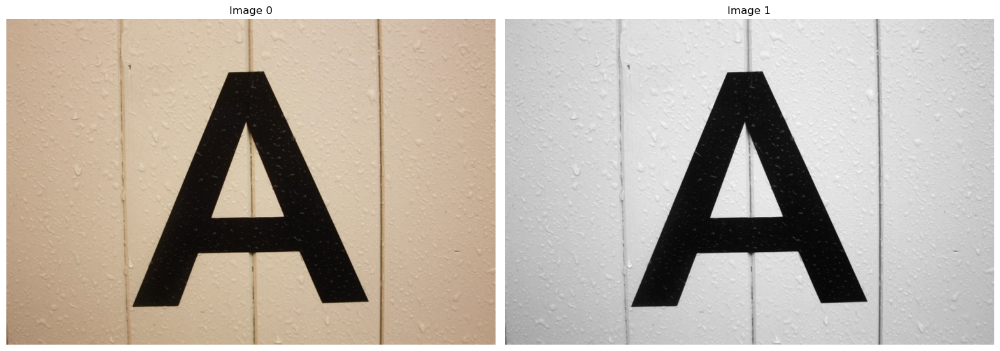

In [165]:
image = cv2.imread('Alphabet.jpg')
img_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ShowImage([image, img_gray], 1, 2)

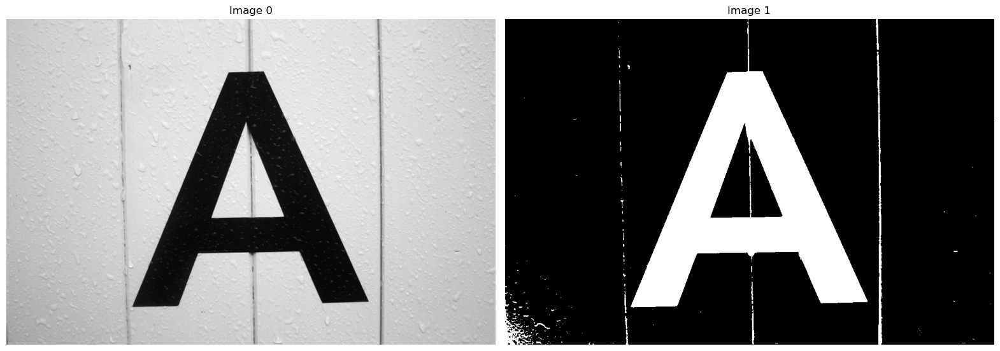

In [166]:
img_mask = (img_gray < 150).astype(np.uint8) * 255
ShowImage([img_gray, img_mask], 1, 2)

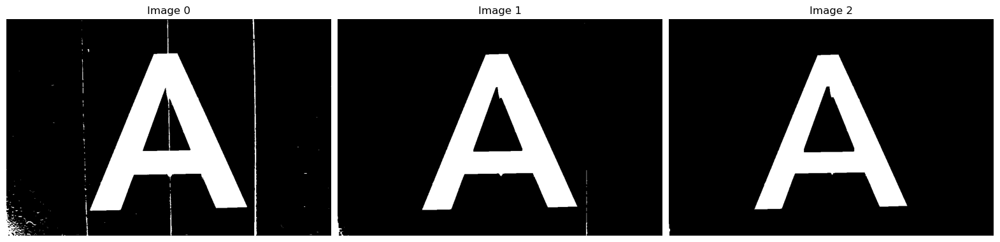

In [167]:
img_erosion01 = cv2.erode(img_mask, kernel, iterations = 1)
img_erosion02 = cv2.erode(img_mask, kernel, iterations = 2)
ShowImage([img_mask, img_erosion01, img_erosion02], 1, 3)


#### **-	Closing**


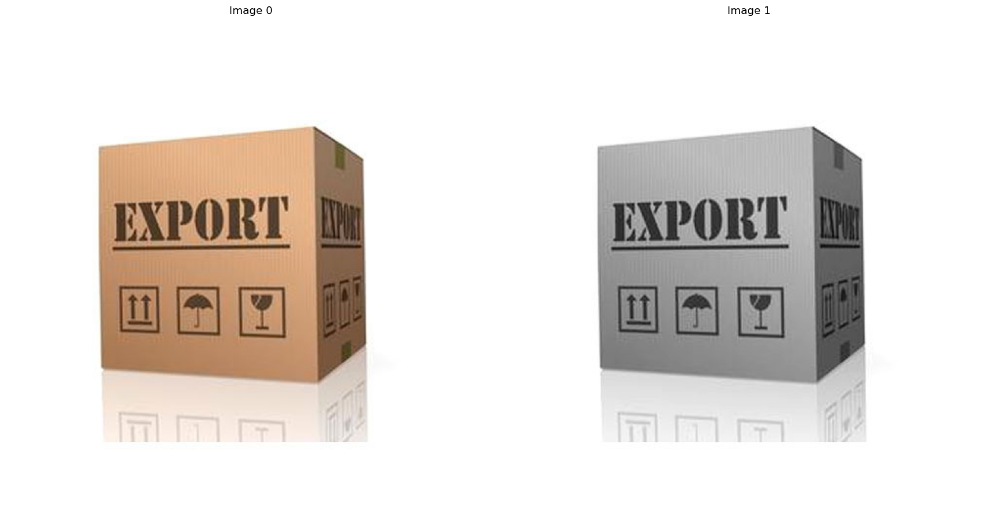

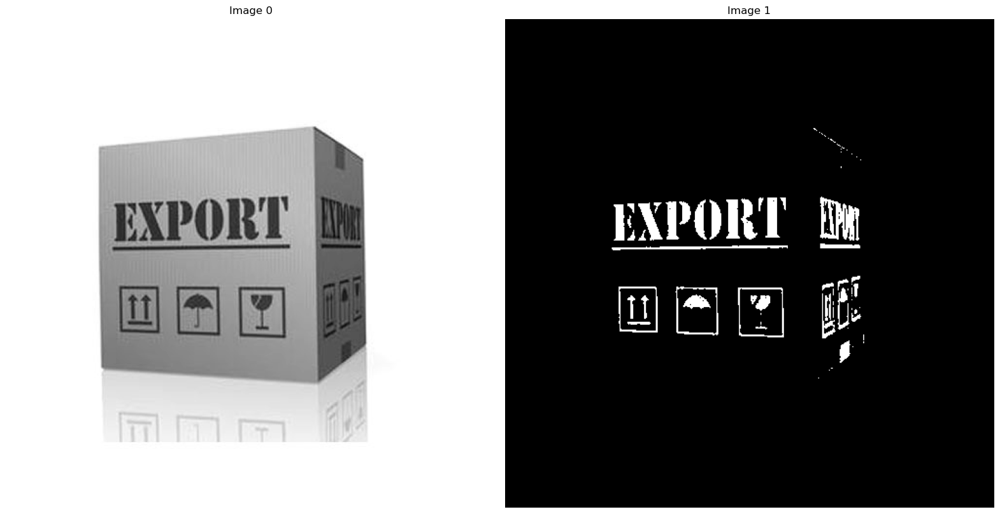

In [168]:
image = cv2.imread('Carton Box.jpg')
image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ShowImage([image, image_gray], 1, 2)

thresh, image_mask = cv2.threshold(image_gray,80,255,cv2.THRESH_BINARY_INV)
ShowImage([image_gray, image_mask], 1, 2)

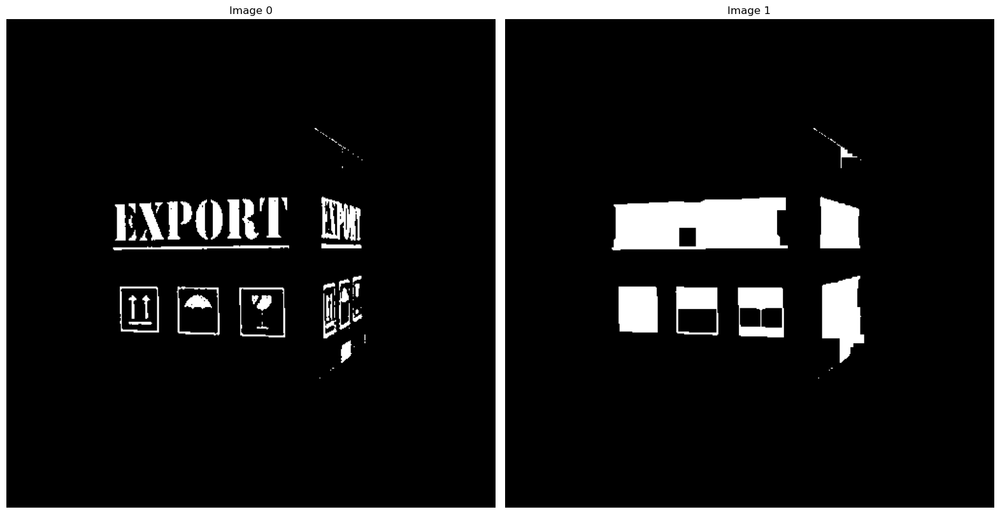

In [169]:
image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel, iterations=4)
ShowImage([image_mask, image_closing], 1, 2)

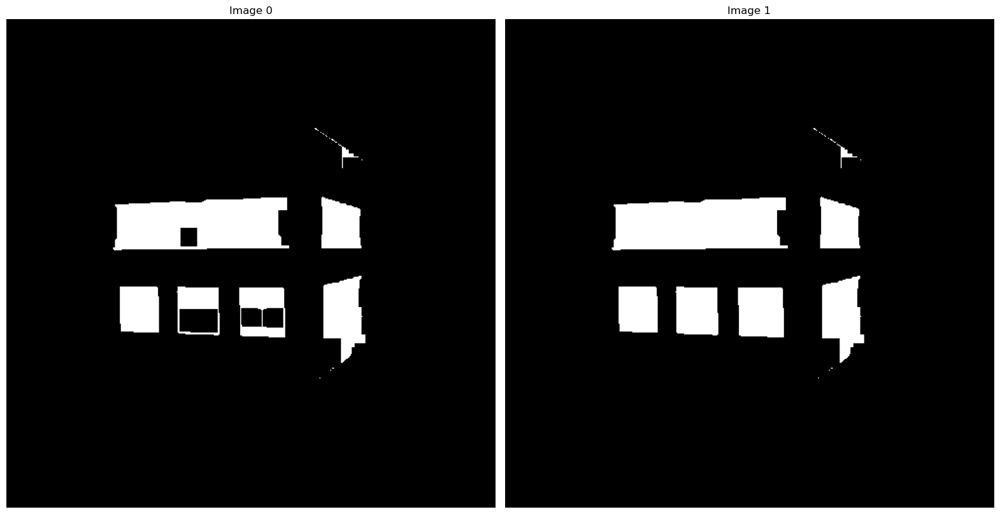

In [170]:
from scipy import ndimage
img_fill = ndimage.binary_fill_holes(image_closing)
ShowImage([image_closing, img_fill], 1, 2)

#### **-	Opening**


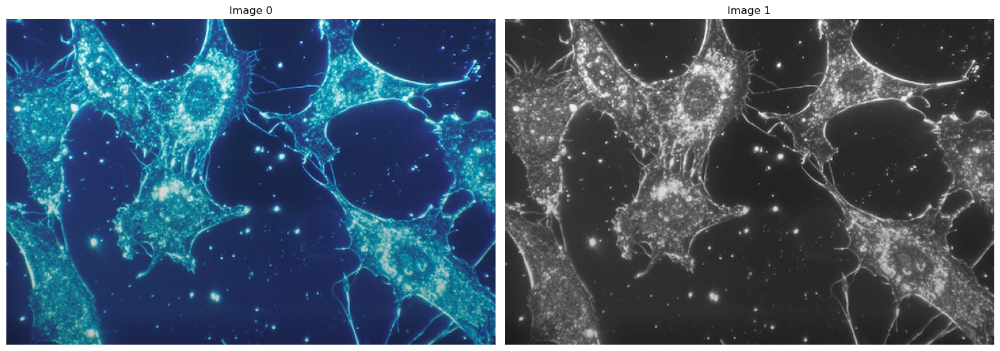

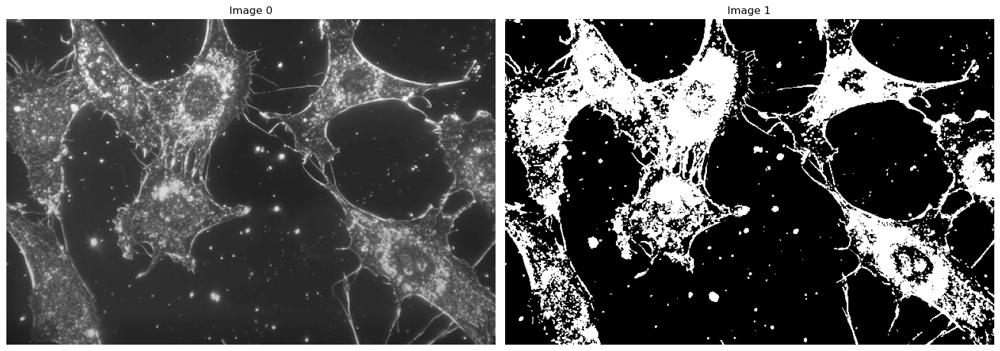

In [171]:
image = cv2.imread('cellular.jpg')
image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ShowImage([image, image_gray], 1, 2)

thresh, image_mask = cv2.threshold(image_gray,90,255,cv2.THRESH_BINARY)
ShowImage([image_gray, image_mask], 1, 2)

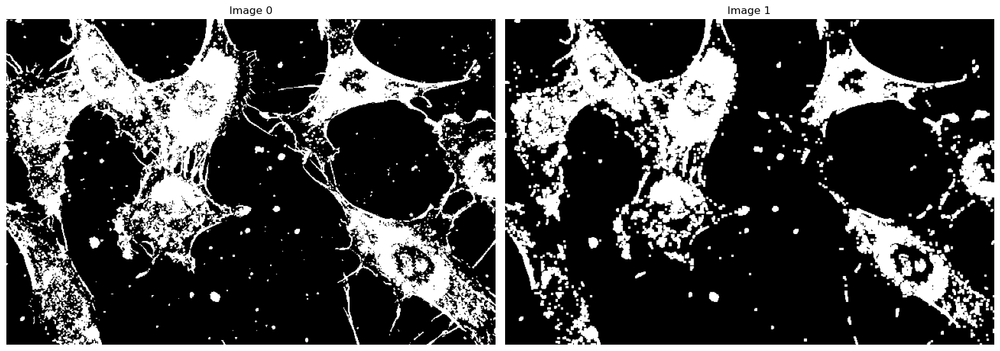

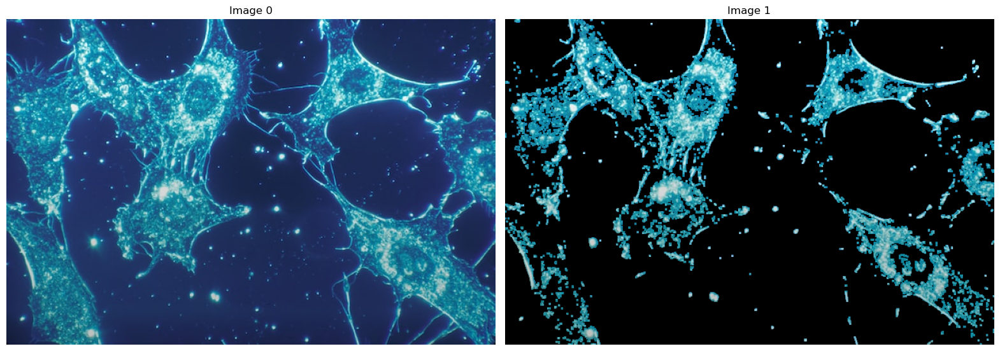

In [172]:
kernel = np.ones((3,3),np.uint8)

# image_erode = cv2.erode(image_mask, kernel, iterations = 1)

image_opening = cv2.morphologyEx(image_mask, cv2.MORPH_OPEN, kernel)
image_opening_color = cv2.bitwise_and(image, image, mask = image_opening)

ShowImage([image_mask, image_opening], 1, 2)
ShowImage([image, image_opening_color], 1, 2)

#### **-	Gradient**


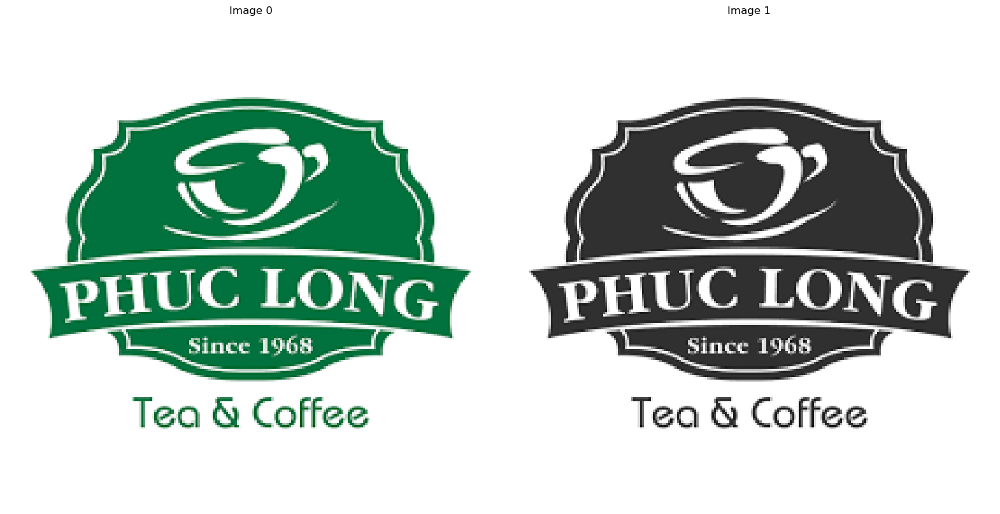

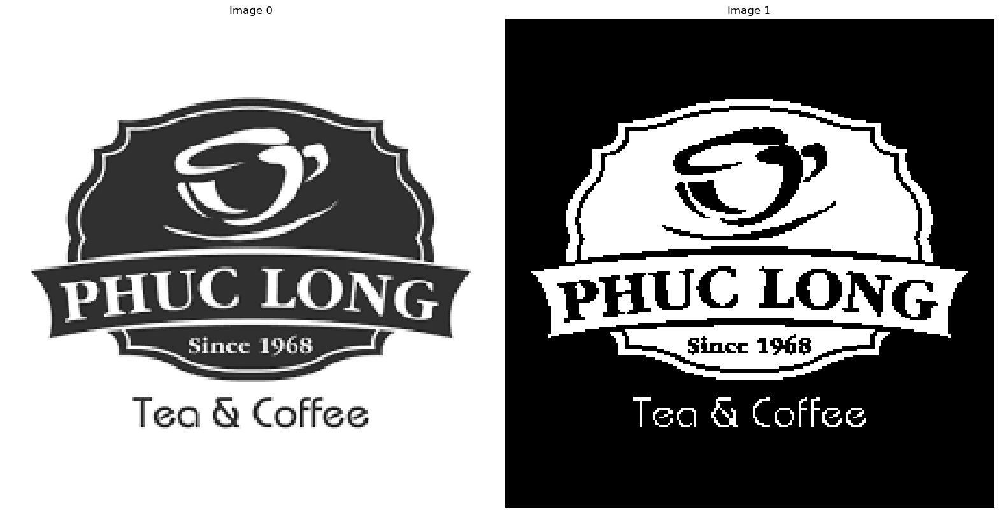

In [173]:
image = cv2.imread('phuclong.png')
img_color = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ShowImage([img_color, img_gray], 1, 2)

thresh, img_mask = cv2.threshold(img_gray, 110, 255, cv2.THRESH_BINARY_INV)
ShowImage([img_gray, img_mask], 1, 2)

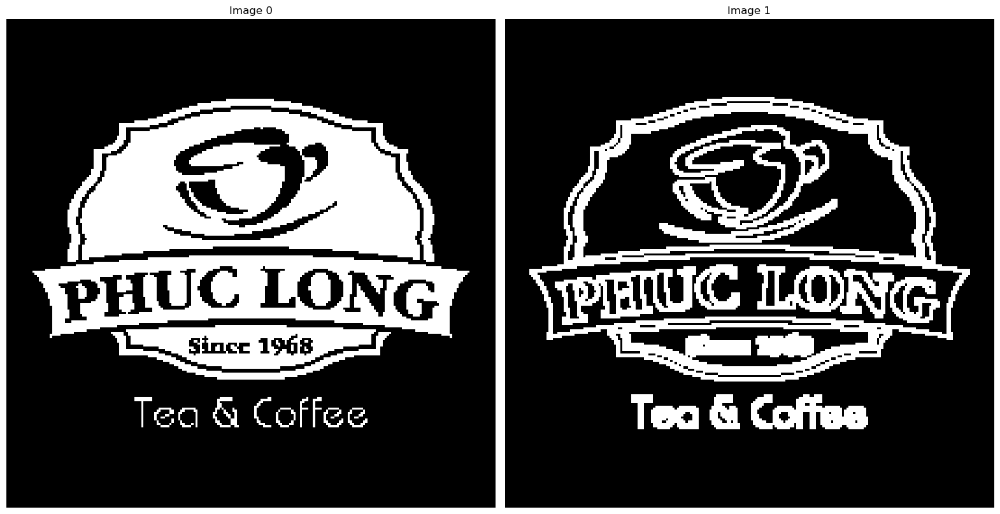

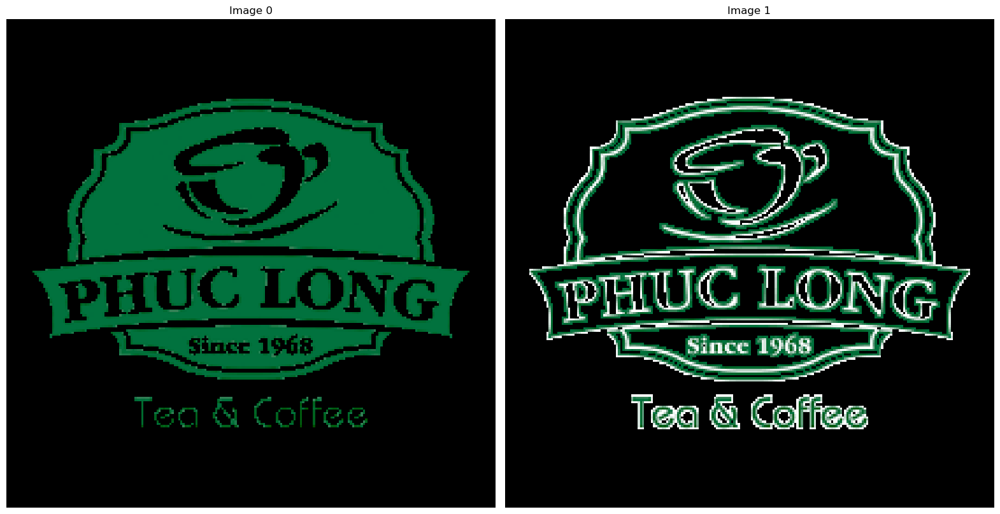

In [174]:
img_gradient = cv2.morphologyEx(img_mask, cv2.MORPH_GRADIENT, kernel)

img_mask_color = cv2.bitwise_and(img_color, img_color, mask=img_mask)

img_gradient_color = cv2.bitwise_and(img_color, img_color, mask=img_gradient)

ShowImage([img_mask, img_gradient], 1, 2)
ShowImage([img_mask_color, img_gradient_color], 1, 2)

### 2/ Kiếm một ảnh biển số xe và thực hiện kết hợp các phương pháp Morphology để trích các con số trên biển số xe 


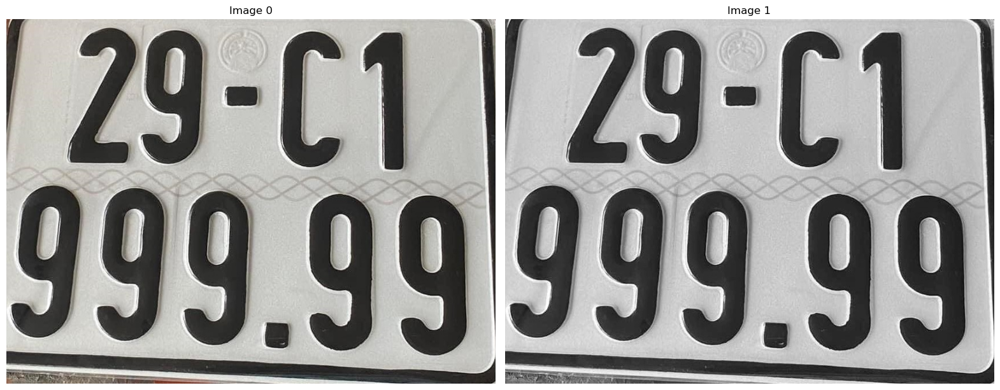

In [175]:
img_color = cv2.imread('bien-so.jpg')
img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
ShowImage([img_color, img_gray],1 ,2)

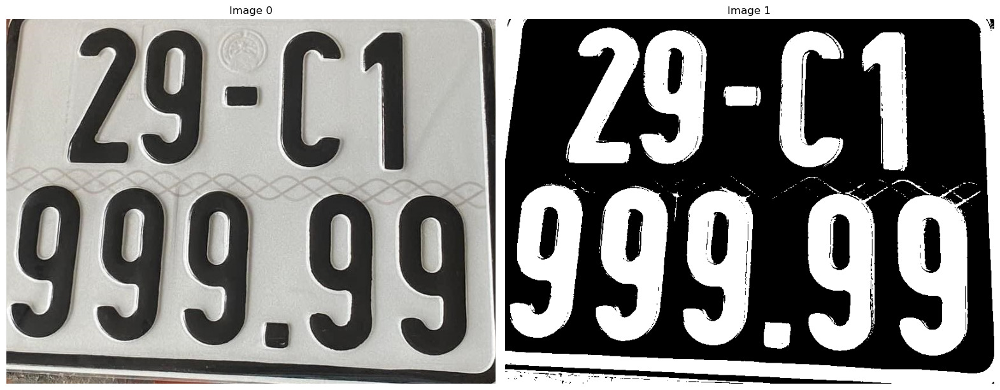

In [176]:
thresh, img_mask = cv2.threshold(img_gray, 160, 255, cv2.THRESH_BINARY_INV)
ShowImage([img_color, img_mask], 1, 2)

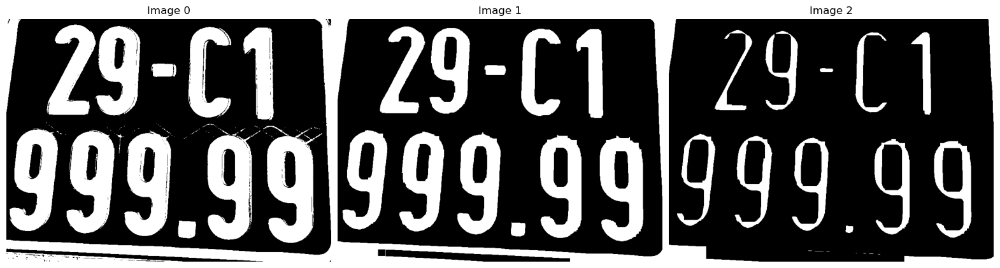

In [177]:
kernel = np.ones((5,5),np.uint8)
img_close = cv2.morphologyEx(img_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
img_erode = cv2.erode(img_close, kernel, iterations = 2)
img_dilate = cv2.erode(img_erode, kernel, iterations = 4)
ShowImage([img_mask, img_erode, img_dilate], 1, 3)

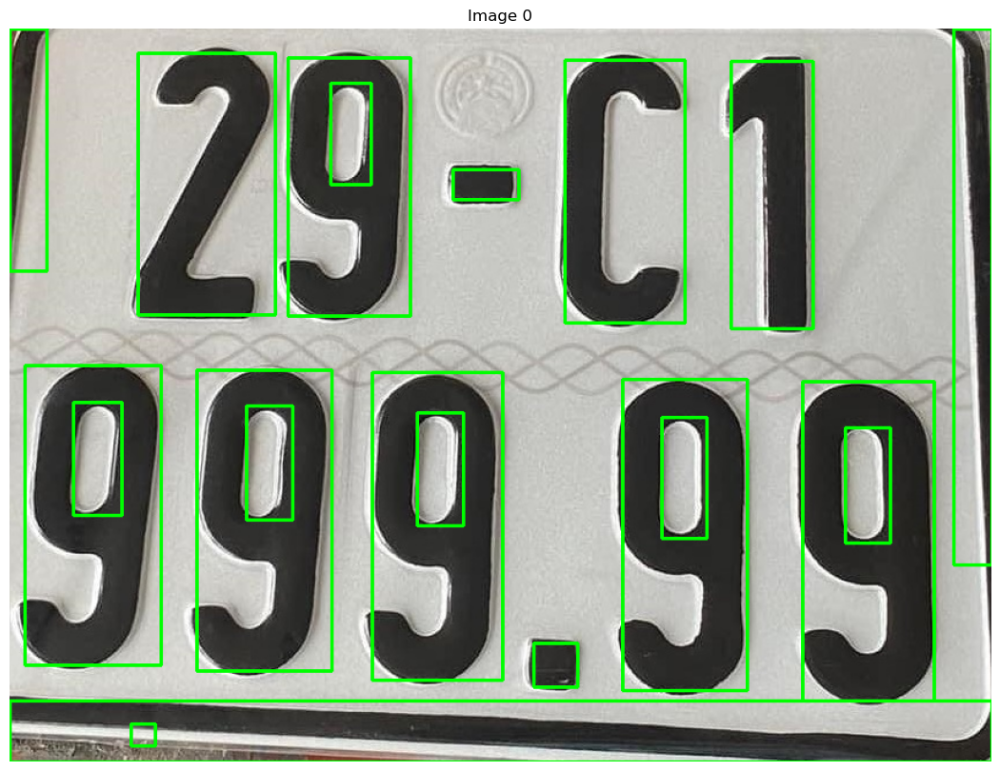

,x,y,w,h
0,0,583,851,53
1,105,603,21,19
2,454,533,38,38
3,687,306,114,277
4,724,346,39,100


In [178]:
data_df, result = detect_all_object(img_color, img_erode)
ShowImage([result], 1, 1)
display(data_df.head())

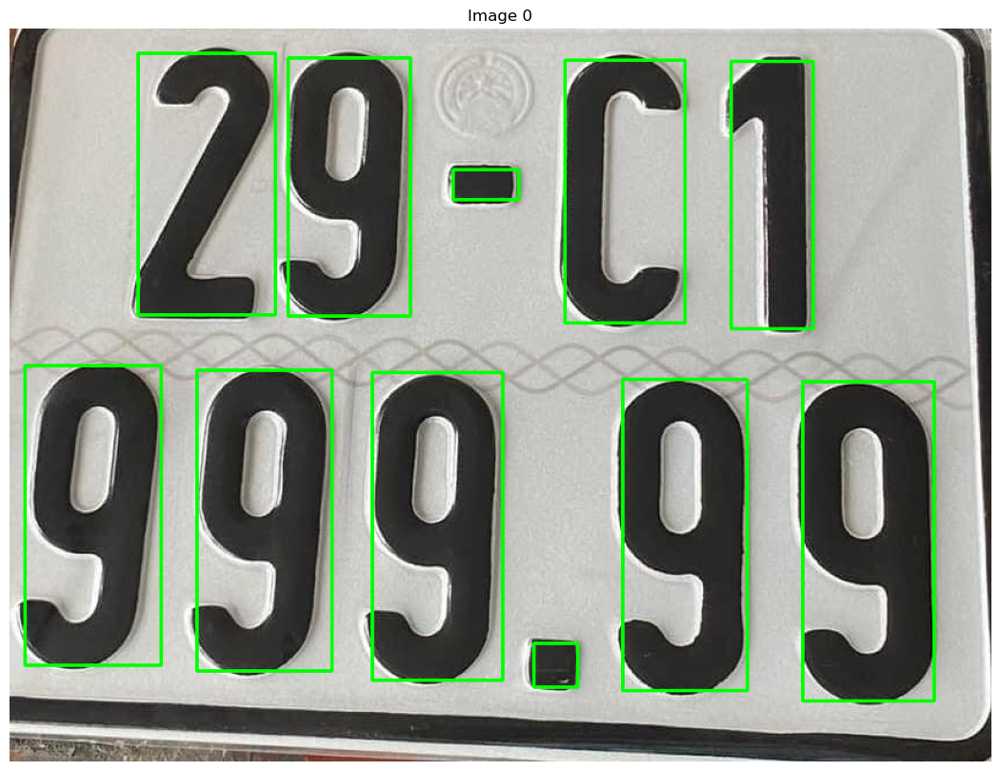

In [179]:
result = img_color.copy()
index = [2, 3, 5, 7, 9, 11, 13, 14, 15, 16, 18]
for idx in index:
  x,y,w,h = data_df.loc[idx, ["x", "y", "w", "h"]]
  cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),2)

ShowImage([result], 1, 1)
    

### 3/ Kiếm một ảnh chụp biển hiệu shop bán hàng kết hợp các phương pháp Morphology để trích các thông tin cửa hiệu 


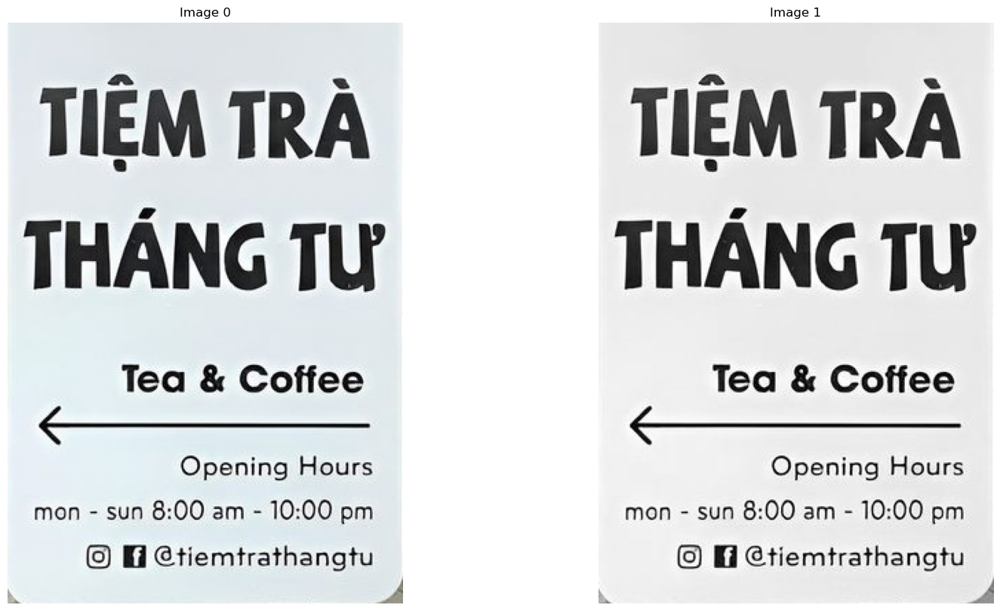

In [180]:
img_color = cv2.imread('bang-hieu.jpg')
img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
ShowImage([img_color, img_gray],1 ,2)

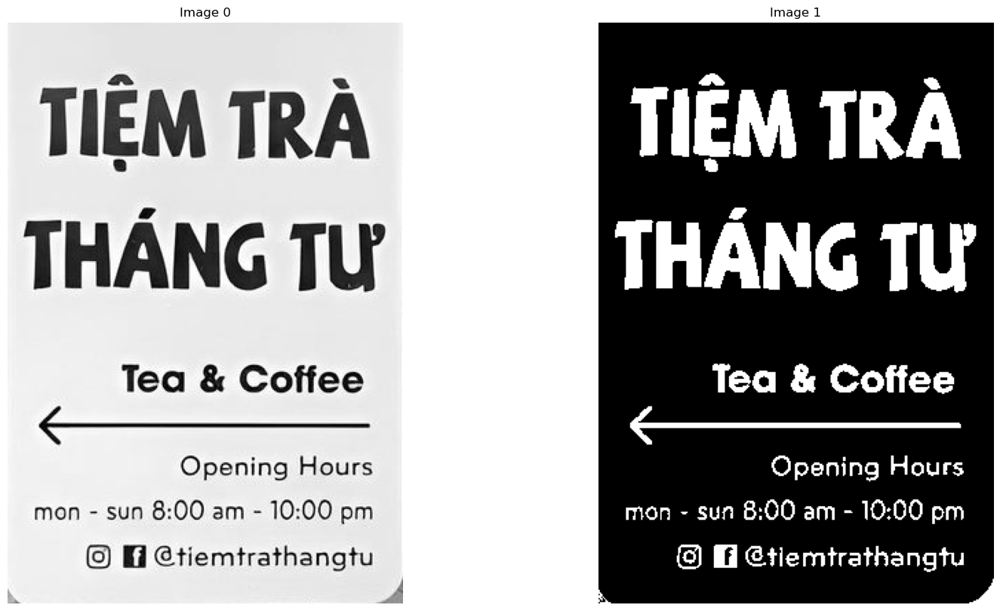

In [181]:
thresh, img_mask = cv2.threshold(img_gray, 180, 255, cv2.THRESH_BINARY_INV)
ShowImage([img_gray, img_mask], 1, 2)

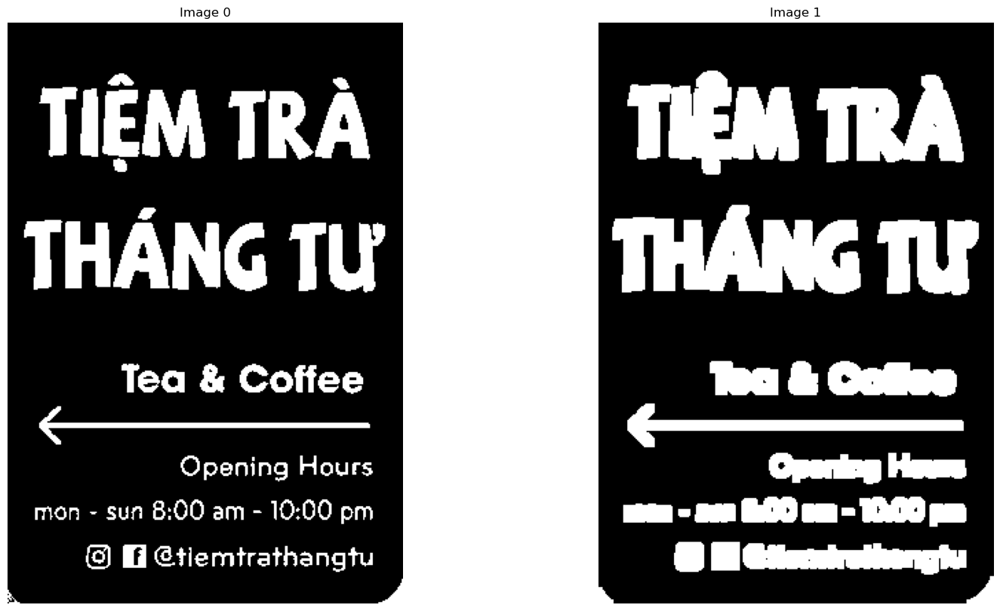

In [182]:
kernel = np.ones((3,3),np.uint8)

img_dilate = cv2.dilate(img_mask, kernel, iterations=2)

ShowImage([img_mask, img_dilate], 1, 2)


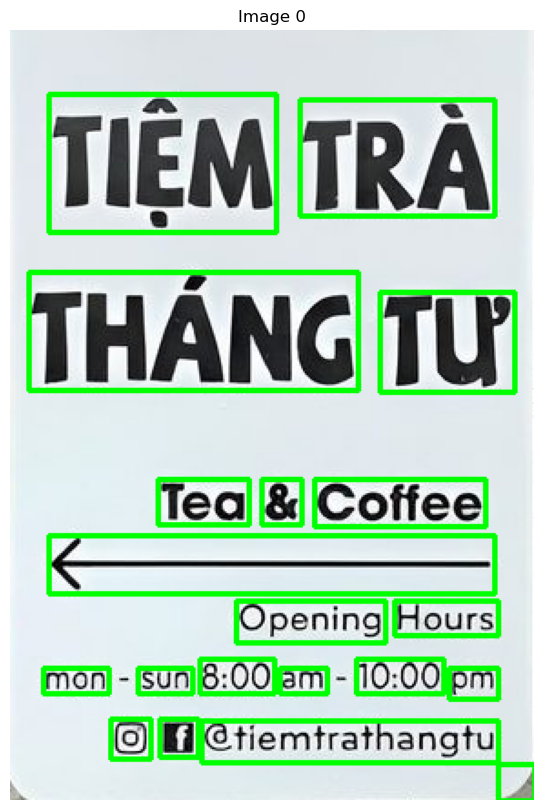

,x,y,w,h
1,268,404,20,20
2,105,380,163,23
6,82,379,21,21
7,55,379,22,22
10,241,351,27,17


In [183]:
data_df, result = detect_all_object(img_color, img_dilate)
ShowImage([result], 1, 1)
display(data_df.head())

### 4/ Chụp 1 dòng chat của bạn và sau đó dùng Morphology để trích các dòng chat đó ra 

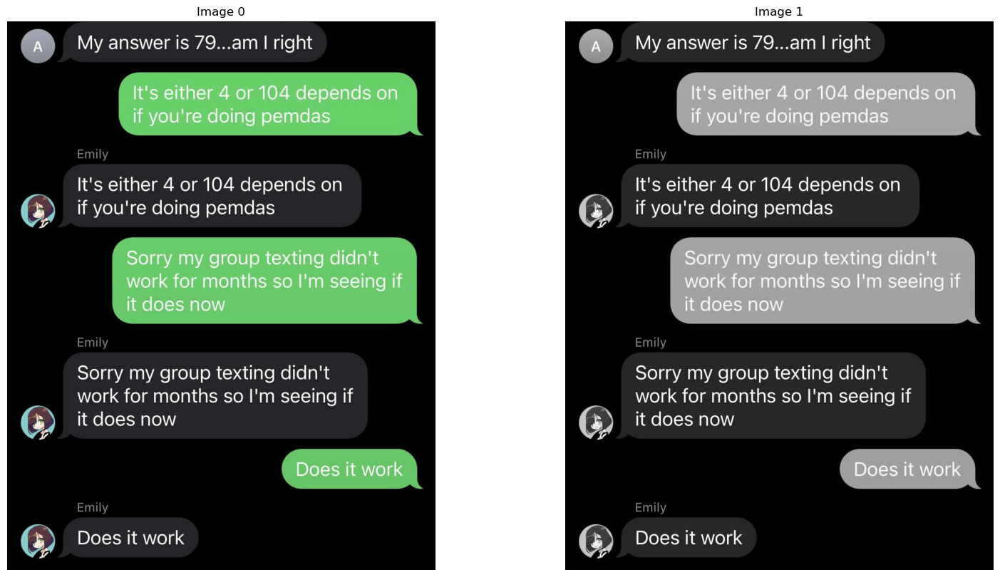

In [184]:
img_color = cv2.imread('chat.png')
img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
ShowImage([img_color, img_gray],1 ,2)

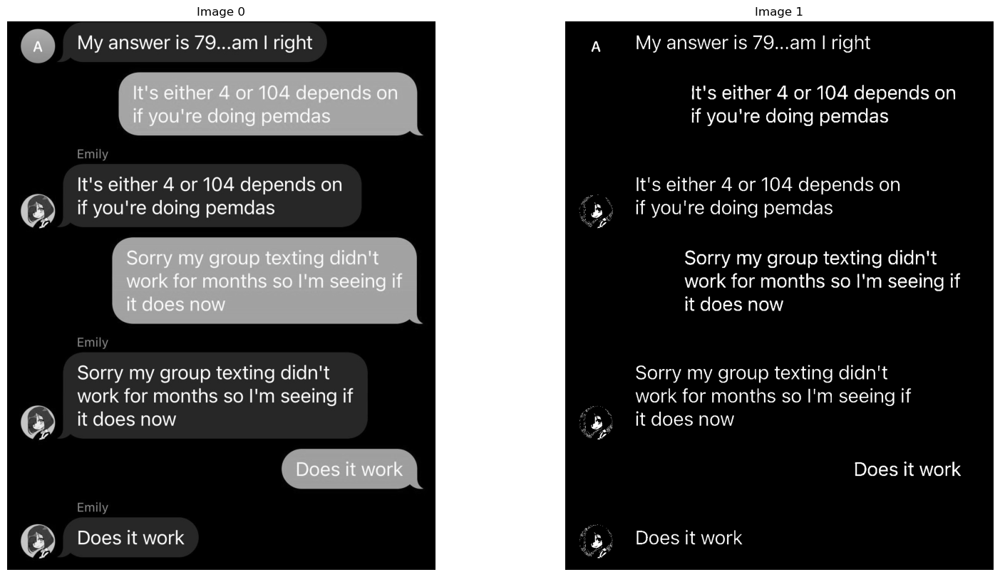

In [185]:

img_mask = cv2.threshold(img_gray, 200, 255, cv2.THRESH_BINARY)[1]
ShowImage([img_gray, img_mask], 1, 2)

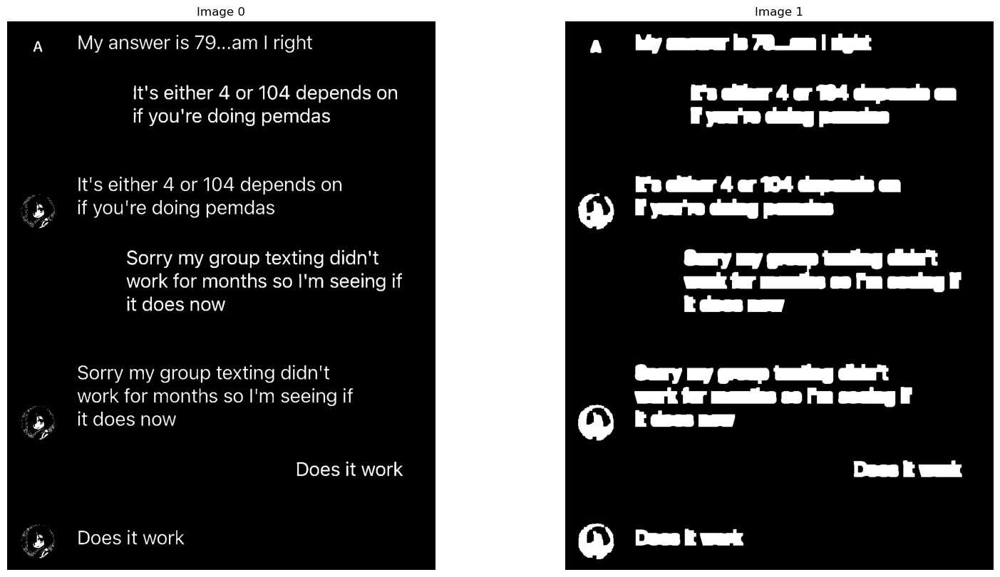

In [186]:
kernel = np.ones((3,3),np.uint8)
img_dilate = cv2.dilate(img_mask, kernel, iterations=3)
img_close = cv2.morphologyEx(img_dilate, cv2.MORPH_CLOSE, kernel, iterations=4)

ShowImage([img_mask, img_close], 1, 2)

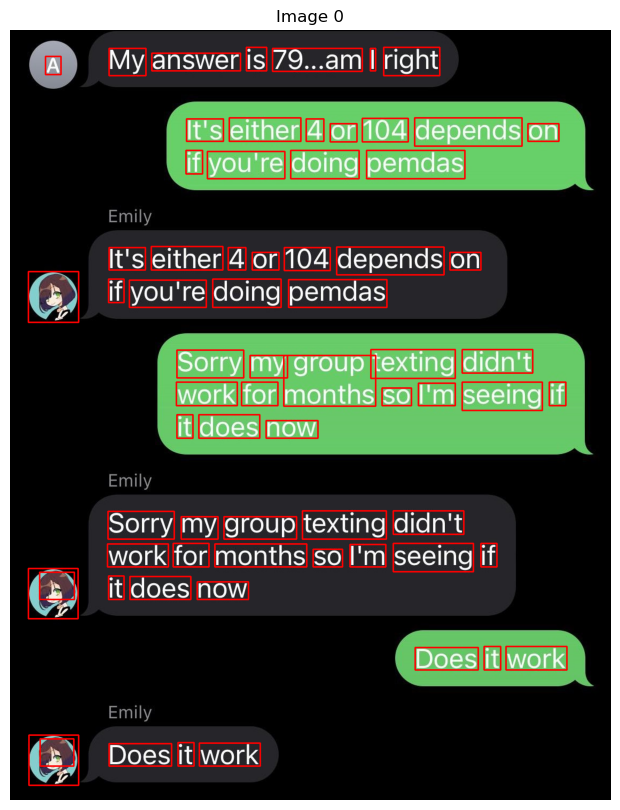

,x,y,w,h
0,185,1336,117,42
2,354,1335,114,43
3,314,1334,30,44
4,35,1320,93,94
5,56,1327,63,51


In [187]:
data_df, result = detect_all_object(img_color, img_close, color=(255, 0, 0))
ShowImage([result], 1, 1)
display(data_df.head())